# Protease Kinetics 
This jupyter notebook will walk you through the data processing and visualization of growth protease kinetics measured from the degradation of FTC-labelled Casein over time by proteases produced by Ruegeria pomeroyi Strain DSS-3 under different media conditions, as conducted in the Master Thesis / Publication by Fadime R. Stemmer (2025): "The Exo-proteomic Framework for Nitrogen Acquisition from Proteinaceous Organic Matter in the Model Marine Heterotroph Ruegeria Pomeroyi DSS-3".

You should have opened this jupyter notebook after cloning the respective GitHub repository 'Rpom_Exoproteome' onto your computer. The file structure of this repo will be used in this code, so for this code to work, it is important that files are not moved or renamed. If you decide to move/rename the files, please adjust the jupyter notebook filepaths accordingly.

The files uploaded to this repository are raw data files from fluorometer measurements at an excitation/emission wavelenght of λ$_{ex/em}=485/538  nm$ over time. The column names were adjusted to match the patterns used in this code. 

## Step 1: Import libraries
First we import all libraries for data import, manipulation, modeling, statistical analysis, and visualization.

In [64]:
import os
import glob
import numpy as np
import pandas as pd
from numpy.polynomial import Polynomial
import matplotlib.pyplot as plt
import seaborn as sns
import csv
from collections import OrderedDict
from scipy.optimize import curve_fit
from scipy.stats import linregress
from scipy.stats import f_oneway
import matplotlib.cm as cm
import matplotlib.colors as mcolors

## Step 2: Data Import and Blank correction

The following functions can be used to determine the blanks in triplicate and subtract them from the triplicate measurements. The functions assumue, that there are three individual blank measurement for each of the four substrate concentrations - 0.5 µM (25 µL), 1 µM (50 µL), 2 µM (100 µL), and 3 µM (150 µL) - for normal measurements `blank_corr3()`; or for two substrate concentrations - 1 µM (50), 2 µM (100) - in ACD and ProMM samples with protease inhibitor `blank_corr_PI()` - respectively.

In [18]:
'''
Function to load the data from MEDIA_FRACTION.txt files as dictionary values and assign to key (= growth medium). 
If successful the function will prompt: "KINETICSDATA loaded into script!"

USAGE: load_data(folder='FOLDERNAME_CONTAINING_KINETICS_TXTFILES')
'''
fluorescence_dic = {}
blank = pd.read_csv('../data/protease_kinetics/BLANK.txt', delimiter='\t')

def load_data(folder=''):
    for file in glob.glob(os.path.join(folder, '*.txt')):
        filename = os.path.basename(file).replace('.txt', '').strip()
        medium_phase = filename
        if filename == 'BLANK':
            print('This is the blank file. Skip and continue...')
        else:
            data = pd.read_csv(file, delimiter='\t')
            fluorescence_dic[medium_phase] = data
        print(f"{medium_phase} loaded into script!")
    return fluorescence_dic

In [19]:
load_data('../data/protease_kinetics/');

This is the blank file. Skip and continue...
BLANK loaded into script!
ACD_INTRAPI loaded into script!
PR_SEC loaded into script!
PROMM_SEC loaded into script!
PROMM_INTRA loaded into script!
PR_INTRAPI loaded into script!
ACD_INTRA loaded into script!
PR_SECPI loaded into script!
NC_INTRA loaded into script!
PROMM_SECPI loaded into script!
ACD_SECPI loaded into script!
PROMM_INTRAPI loaded into script!
PR_INTRA loaded into script!
NC_SEC loaded into script!
ACD_SEC loaded into script!
NC_INTRAPI loaded into script!
NC_SECPI loaded into script!


In [20]:
"""
The function blank_corr() is used to subtract the mean of the blank measurements from all triplicates. 
It takes following arguments: 
* data_dic: dictionary containing the raw data
* blank_df: dataframe containing blank measurements. 

USAGE: blank_corr(DICTIONARY_WITH_FLUORESCENCEDDATA, BLANK_DATAFRAME)
"""
def blank_corr(data_dic, blank_df=''):   
    # Extract the blank columns, and calculate mean blank series per concentration
    blank_means = {
        '25': blank_df.loc[:, '25_1':'25_3'].mean(axis=1),
        '50': blank_df.loc[:, '50_1':'50_3'].mean(axis=1),
        '100': blank_df.loc[:, '100_1':'100_3'].mean(axis=1),
        '150': blank_df.loc[:, '150_1':'150_3'].mean(axis=1)
    }
    #Subtract corresponding blank from matching columns in each dataset
    for key, df in data_dic.items():
        blankcorr = df.copy()
        for conc in ['25', '50', '100', '150']:
            blank_series = blank_means[conc]
            # Identify the columns that contain the concentration label (e.g., '25_1', '25_2', '25_3')
            conc_col = [col for col in blankcorr.columns if conc in col]
            for col in conc_col:
                blankcorr[col] = pd.to_numeric(blankcorr[col], errors='coerce') - blank_series

        data_dic[key] = blankcorr
        print(f"Updated {key} dataset")
    return data_dic

In [21]:
blank_corr(fluorescence_dic, blank);

Updated ACD_INTRAPI dataset
Updated PR_SEC dataset
Updated PROMM_SEC dataset
Updated PROMM_INTRA dataset
Updated PR_INTRAPI dataset
Updated ACD_INTRA dataset
Updated PR_SECPI dataset
Updated NC_INTRA dataset
Updated PROMM_SECPI dataset
Updated ACD_SECPI dataset
Updated PROMM_INTRAPI dataset
Updated PR_INTRA dataset
Updated NC_SEC dataset
Updated ACD_SEC dataset
Updated NC_INTRAPI dataset
Updated NC_SECPI dataset


## Step 3: Functions to be used for data preparation

Before we can plot our data, we need to normalize, calculate mean and standard deviation and convert the time to a format that can be used by matplotlib to plot. We therefore create the functions normalize() and mean_std() that can be used in downstream plots. 

In [22]:
"""
The function normalize() is used to normalize the replicates 
The function mean() is used to calculate the mean of triplicate measurements for plotting 
Parameters: 
    * data_dic: dictionary containing blank corrected fluorescence data

"""
def normalize(df):
    normalized_df = df.copy()
    # Normalize the data to start at 0 fluorescence
    for col in df.columns:
        if col != 'Time':
            normalized_df[col] = df[col] - df[col].iloc[0]
    return normalized_df

def mean_std(df):
    time = df.iloc[:, 0]
    meanstd = pd.DataFrame({'Time': time})

    for i in range(4):
        start = 1+ i * 3
        end= start + 3
        triplicates = df.iloc[:, start:end]

        means = triplicates.mean(axis=1)
        stds = triplicates.std(axis=1)

        meanstd[f'Sample_{i+1}_mean'] = means
        #meanstd[f'Sample_{i+1}_std'] = stds
    return meanstd

def timetomin(time_str):
        h, m, s = map(int, time_str.split(':')) 
        return h * 60 + m

## Step 4: Rate determination and plotting

Finally, we want to quality control our triplicate measurements by plotting either triplicates and/or mean against time, and eventually extract fluorescence kinetics from the rate determined at t=0. 

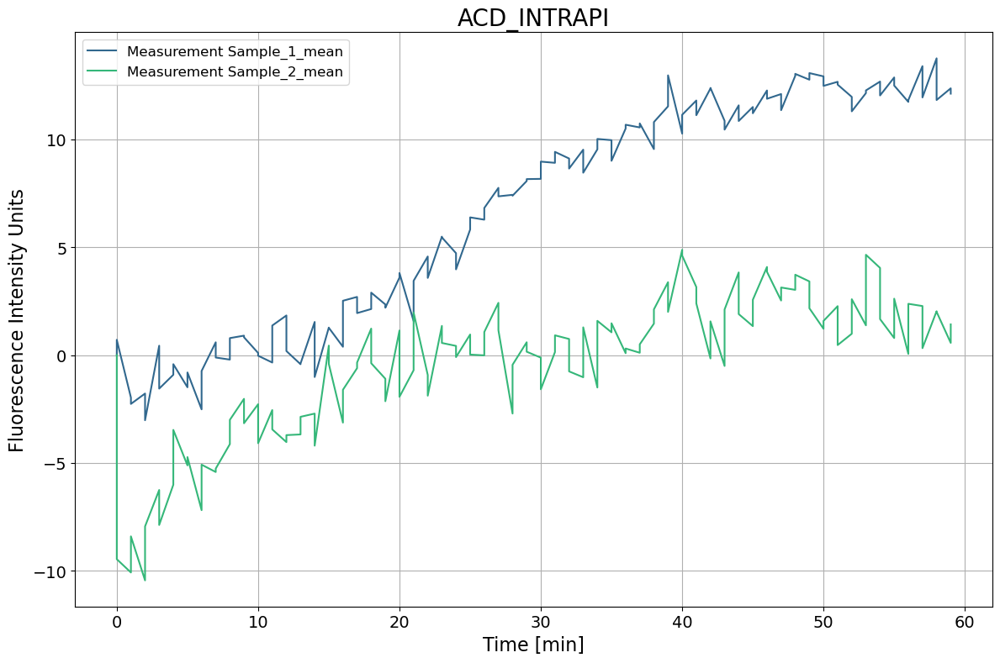

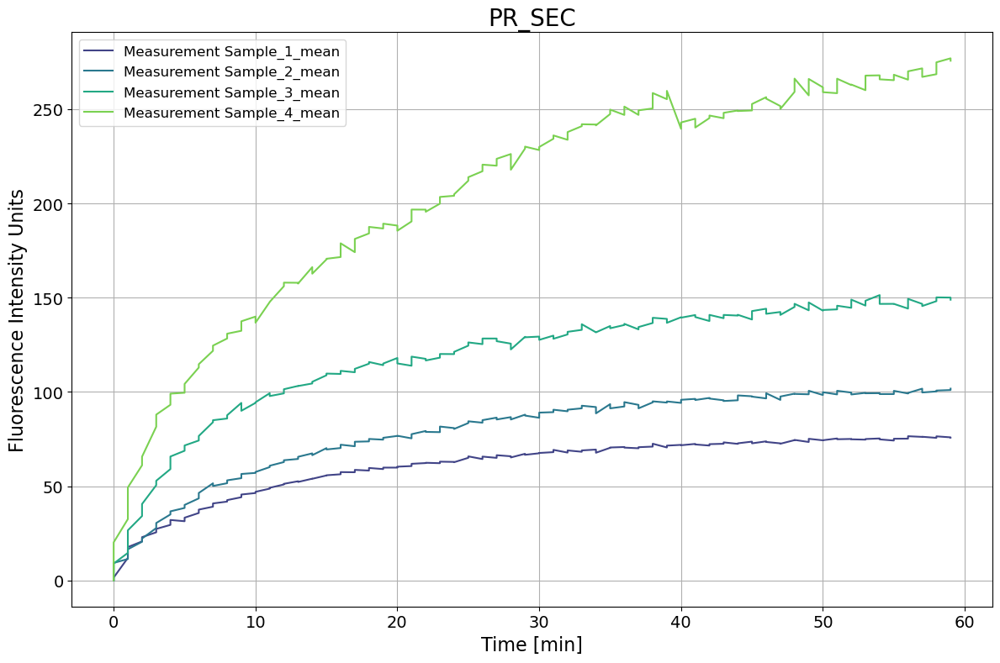

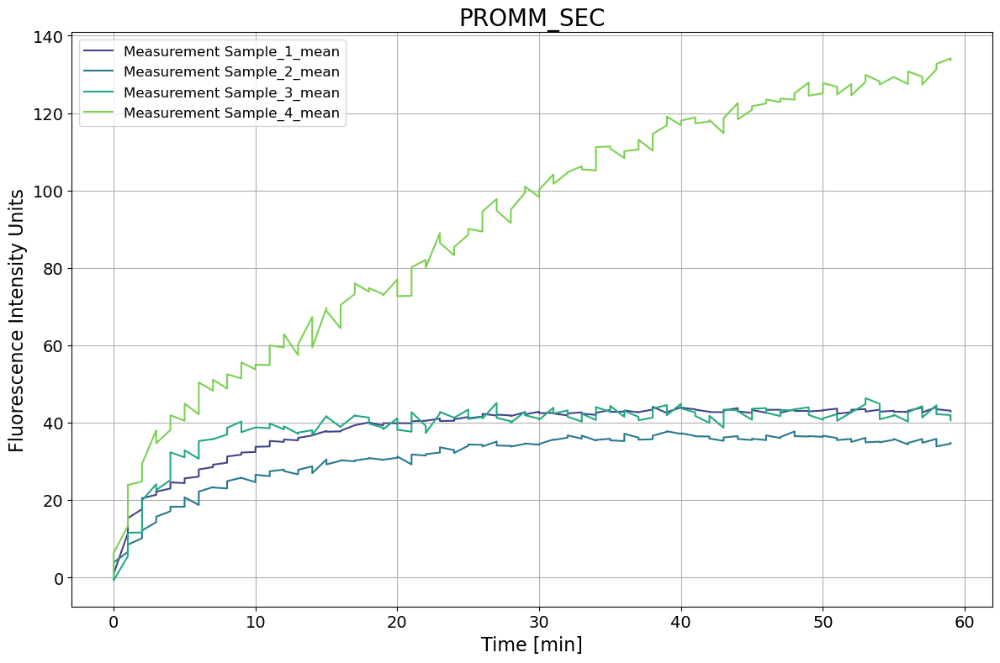

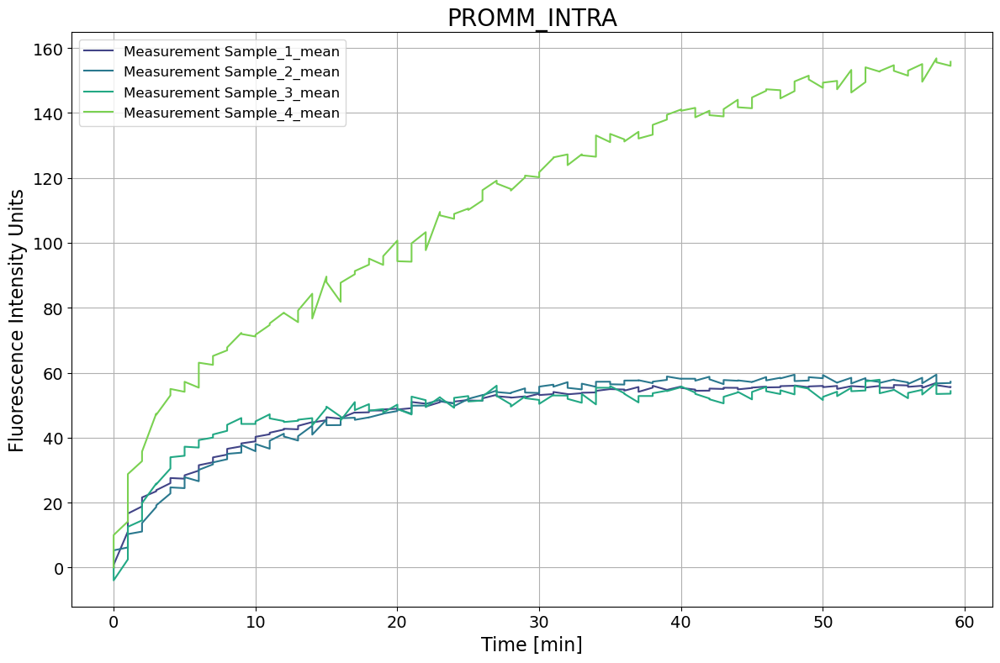

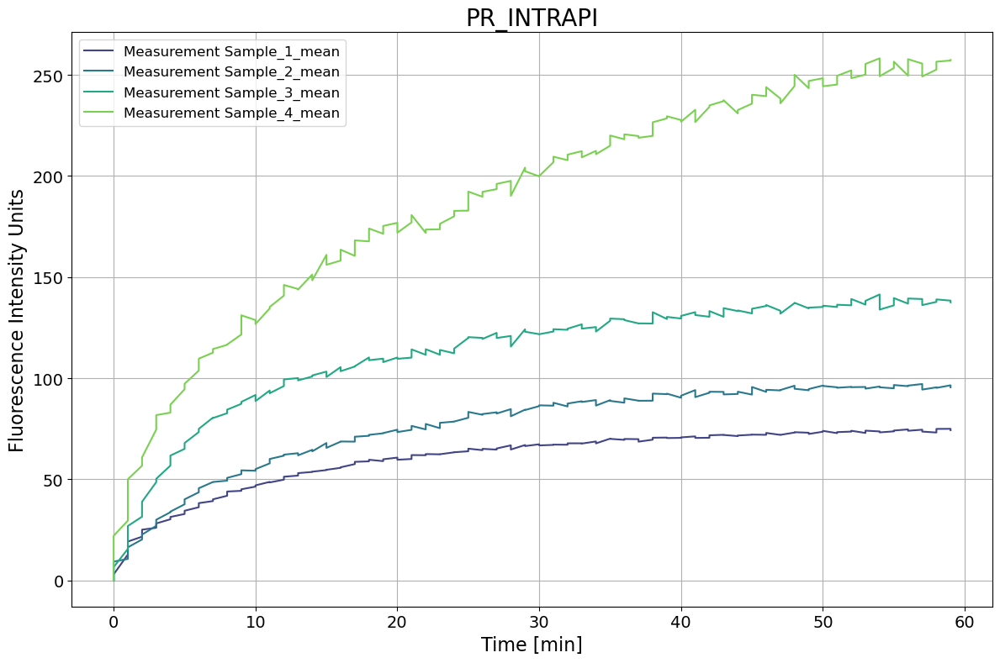

...

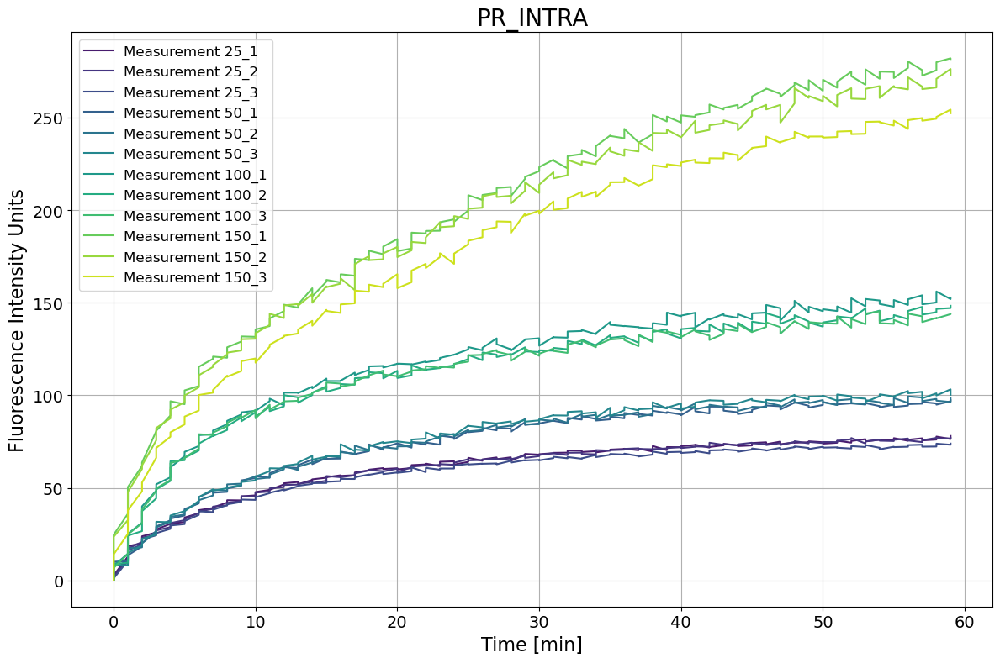

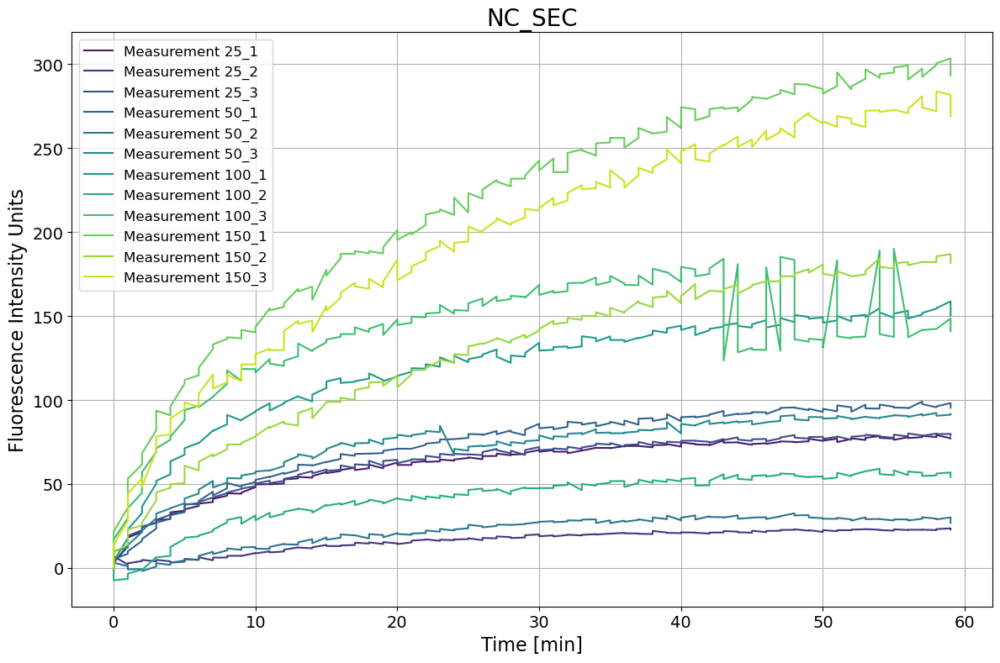

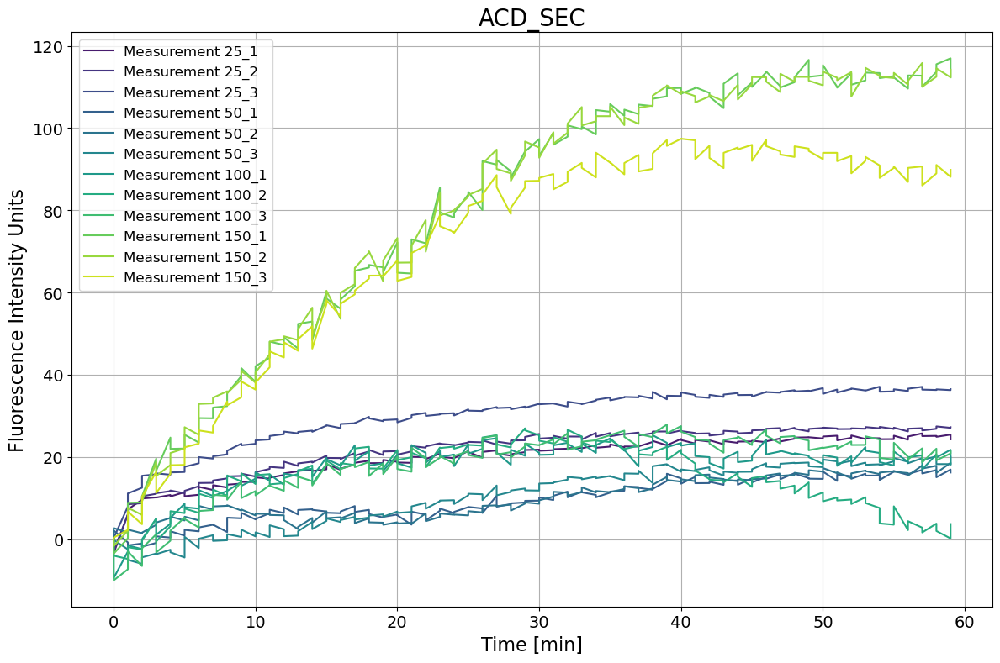

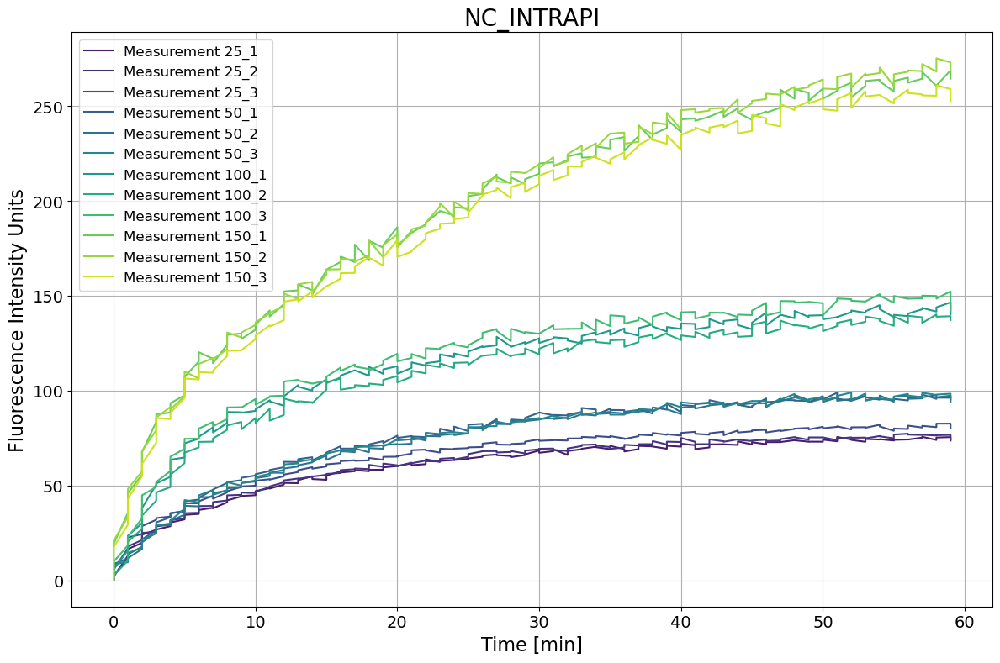

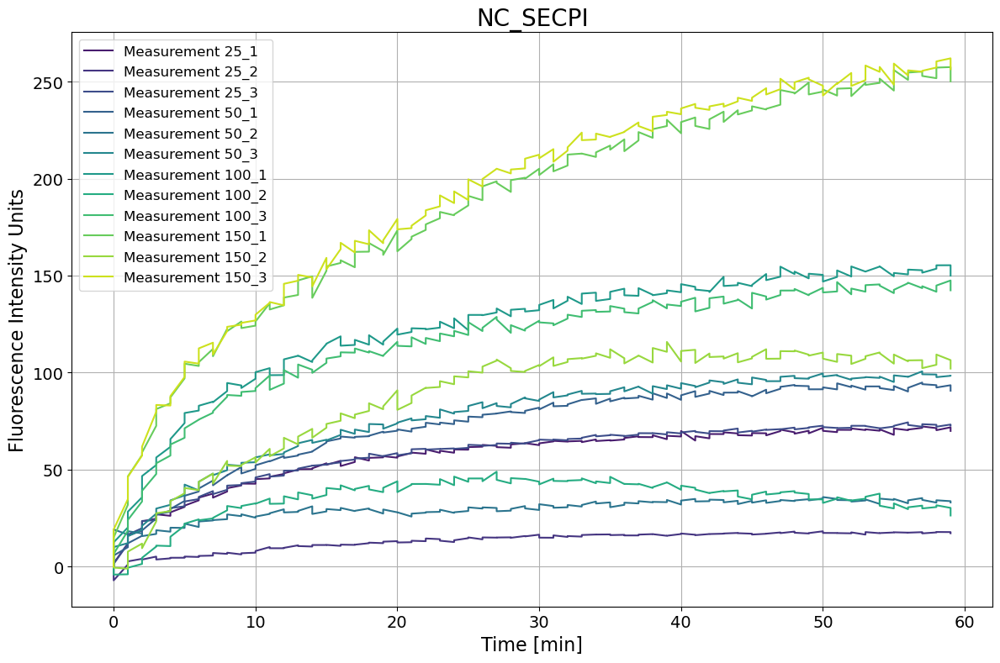

In [23]:
"""
This function can be used to plot the blank corrected fluorescence data against time.
Returns: plots of fluorescence vs. time in min.
By default this function will plot mean fluorescence vs. time, unless you specify in the second argument of the function 
to explicitly plot single measurements. 

ARGUMENTS: 
    * data_dic: Input dictionary with blank corrected fluorescence and time data
    * plots: This argument has two options: 
        * mean: plot the mean fluorescence vs. time (default)
        * triplicate: plots triplicate measurements vs. time
"""
def plot_flvstime(data_dic, plots='mean'):
    for key, df in data_dic.items():
        ## LETS PLOT OUR FIGURE
        plt.figure(figsize=(12, 8))

        if plots == 'triplicate':
            '''
            This section plots each measurement separately. 
            This is a little messy but can be helpful for quality control. 
            Later, when we want to assess the statistical significance of the v0 values, we need to use the single measurements. 
            '''
            # Convert time column values to units of hours using the timetohours() function and safe data to df as new column named 'Time_hr'
            df['Time_hr'] = df['Time'].apply(timetomin)
            # Normalize
            df = normalize(df)
            
            if key in ['ACD_INTRAPI', 'ACD_SECPI', 'PROMM_SECPI', 'PROMM_INTRAPI']:
                colors=sns.color_palette("viridis", n_colors=6)
                # Iterate i through each triplicate column col (1, 2, 3) of each sample in the dataframe, excluding the Time column
                for i, col in enumerate(df.columns[1:7]): 
                    # Create a plot of the selected triplicate columns (col) against the time in hours and add a label for each measurement
                    plt.plot(df['Time_hr'], df[col], label=f"Measurement {col}", color=colors[i])
            
            else:   
                colors=sns.color_palette("viridis", n_colors=12)
                # Iterate i through each triplicate column col (1, 2, 3) of each sample in the dataframe, excluding the Time column
                for i, col in enumerate(df.columns[1:13]): 
                    # Create a plot of the selected triplicate columns (col) against the time in hours and add a label for each measurement
                    plt.plot(df['Time_hr'], df[col], label=f"Measurement {col}", color=colors[i])
            plt.title(f"{key}", fontsize=20)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            plt.xlabel("Time [min]", fontsize=16)
            plt.ylabel(r'Fluorescence Intensity Units', fontsize=16)
            plt.legend(loc='upper left', fontsize='12')
            plt.grid()
            plt.tight_layout()
            plt.savefig(f"../output/kinetics/{key}_triplicatekinetics.pdf", format='pdf')
            plt.show()
        
        else:
            '''
            Plots the mean of the triplicate measurements. 
            NOTE:   We noticed in the triplicate plots that secretome measurements of NC and ProMM of measurement 150_1 were outliers. 
                    These measurements were therefore removed from downstream processing.
            '''
            # Calculate the mean and std for each triplicates using the function mean_std() and assign to variables mean and std
            if key in ['NC_SEC', 'NC_SECPI', 'PROMM_SEC']:
                df = df.drop(columns=['150_1'])
                df= mean_std(df)
            else:
                df = mean_std(df)
            # Convert time column values to units of hours using the timetohours() function and safe data to df as new column named 'Time_hr'
            df['Time_hr'] = df['Time'].apply(timetomin)
            # Normalize
            df = normalize(df)
            
            if key in ['ACD_INTRAPI', 'ACD_SECPI', 'PROMM_SECPI', 'PROMM_INTRAPI']:
                colors=sns.color_palette("viridis", n_colors=2)
                # Iterate i through each triplicate column col (1, 2, 3) of each sample in the dataframe, excluding the Time column
                for i, col in enumerate(df.columns[1:3]): 
                    # Create a plot of the selected triplicate columns (col) against the time in hours and add a label for each measurement
                    plt.plot(df['Time_hr'], df[col], label=f"Measurement {col}", color=colors[i])
            
            else: 
                colors=sns.color_palette("viridis", n_colors=4)
                for i, col in enumerate(df.columns[1:5]):
                    plt.plot(df['Time_hr'], df[col],label=f"Measurement {col}", color=colors[i])
            
            # Customize the plot
            plt.title(f"{key}", fontsize=20)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            plt.xlabel("Time [min]", fontsize=16)
            plt.ylabel(r'Fluorescence Intensity Units', fontsize=16)
            plt.legend(loc='upper left', fontsize='12')
            plt.grid()
            plt.tight_layout()
    
            # Display the plot and save (optional, uncomment if you want to save in figures/ folder).
            plt.savefig(f"../output/kinetics/{key}_meankinetics.pdf", format='pdf')
            plt.show()

plot_flvstime(fluorescence_dic, plots='mean')
plot_flvstime(fluorescence_dic, plots='triplicate')

In [24]:
"""
The function select_degree() helps us find the best degree polynomial to fit the data without under or overfitting.
It selects this degree based on the Bayesian information criterion.
    Parameters:
        * time:
        * values: 
        * max_degree:
    Returns:
        
"""

def select_degree(time, values, max_degree=15):
    results = []

    for d in range(1, max_degree + 1):
        try:
            poly = Polynomial.fit(time, values, d)
            poly_eval = poly(time)

            # Derivative
            deriv = poly.deriv()(time)
            max_deriv = np.max(deriv)
            std_deriv = np.std(deriv)

            # Fit quality
            rss = np.sum((values - poly_eval) ** 2)
            n = len(time)
            k = d + 1  # number of parameters
            aic = n * np.log(rss/n) + 2 * k
            bic = n * np.log(rss/n) + k * np.log(n)

            results.append({
                "degree": d,
                "R²": 1 - rss / np.sum((values - np.mean(values)) ** 2),
                "AIC": aic,
                "BIC": bic,
                "max_deriv": max_deriv,
                "std_deriv": std_deriv,
                "poly": poly
            })
        except Exception as e:
            print(f"Degree {d} failed: {e}")

    # Choose based on lowest BIC or some combination
    degree = min(results, key=lambda x: x["BIC"])
    return degree, results
    
"""
This function plots fluorescence kinetics with polynomial fitting and displays fit statistics.
    Parameters:
    
    Returns:
        - fit_stats: Dictionary with max derivative and fit statistics for each condition 
"""

def plot_kinetics(data_dic):
    for key, df in data_dic.items():
        fit_stats = {}  # Dictionary to store fit statistics
        
        # Calculate the mean and std for each triplicates using the function mean_std() and assign to variables mean and std
        if key in ['NC_SEC', 'NC_SECPI', 'PROMM_SEC']:
            df = df.drop(columns=['150_1'])
            #df= mean_std(df)
        #else:
            #df = mean_std(df)
        # Convert time column values to units of hours using the timetohours() function and safe data to df as new column named 'Time_hr'
        df['Time_hr'] = df['Time'].apply(timetomin)
        time = df['Time_hr']
        # Normalize
        df = normalize(df)

        # Apply Viridis color palette with length of the color palette defined by number of columns (samples)
        colors = sns.color_palette("viridis", n_colors=len(df.columns))
        plt.figure(figsize=(15, 8))

        ## Fit a polynomial fit to the data. 
        # for each column, we assign an index with the enumerate function.
        for i, col in enumerate(df.columns[1:13]):
            # plot the fluorescence of the normalized data  vs. time. Labels and colors are based on the column that is currently run
            if col != 'Time_hr':
                plt.plot(time, df[col], label=col, color=colors[i])
                # if there are no errors, following code will be executed:
                try:
                    best_result, _ = select_degree(time, df[col])
                    degree = best_result["degree"]
                    # Polynomial fitting 
                    poly = Polynomial.fit(time, df[col], degree) #run the polynomial fit using the new Numpy Polynomial.fit and assign to poly_coeff variable
                    poly_eval = poly(time) # evaluates the polynomial by calculating the values of the coefficients at each timepoint
    
                    # Derivative and its evaluation
                    deriv_poly = poly.deriv()
                    deriv_values = deriv_poly(time)
    
                    # Max growth rate (maximal value of the derivative should be t=0)
                    slope_t0 = deriv_poly(0)
    
                    # Fit statistic - compute R^2 
                    R2 = 1 - np.sum((df[col] - poly_eval) ** 2) / np.sum((df[col] - np.mean(df[col])) ** 2)
    
                # Store all the values in a dictionary such that we can call them later.
                    fit_stats[col] = {
                        "derivative_t0": slope_t0,
                        "degree": degree,
                        "R²": R2
                    }
 
                    # Plot polynomial fit
                    plt.plot(time, poly_eval, '--', color=colors[i], alpha=0.8, label=f"{col} (Poly Fit)")

                # If there is an error in the function, it will call the exception and launch an error message. 
                except Exception as e:
                    print(f"Error in fitting polynomial for {col}: {e}")
        plt.title(f"{key}", fontsize=20)
        plt.xlabel('Time [min]')
        plt.ylabel('Fluorescence Intensity')
        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        plt.savefig(f"../output/kinetics/{key}_polyfit.pdf", format='pdf')
        plt.show()
        plt.close()
    
        # Open a csv file for writing the fit statistics and extracted derivative into a file
        with open(f"../output/kinetics/polyfit_data_{key}.csv", "w", newline="") as file:
            fieldnames = ["Condition", "derivative_t0", "degree", "R²"]
            writer = csv.DictWriter(file, fieldnames=fieldnames)
            writer.writeheader()
            for condition, stats in fit_stats.items():
                writer.writerow({"Condition": condition, **stats})
    return fit_stats

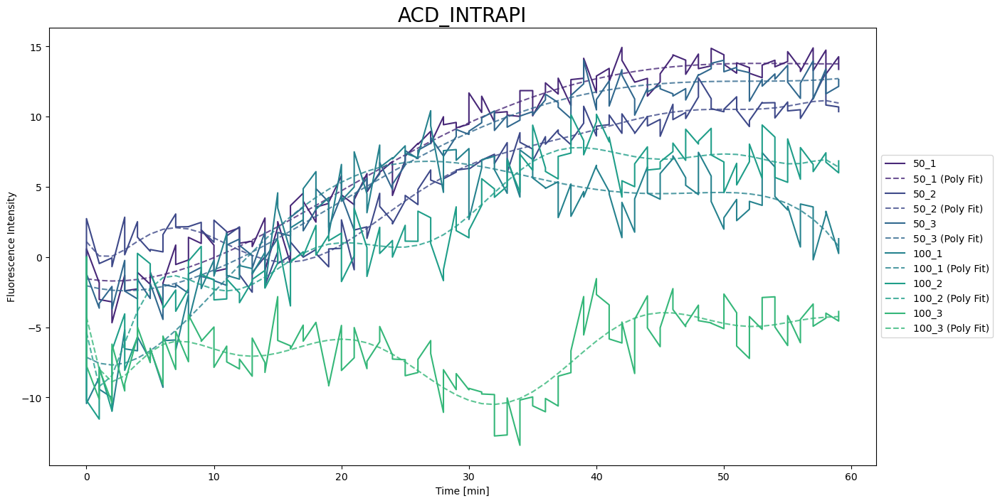

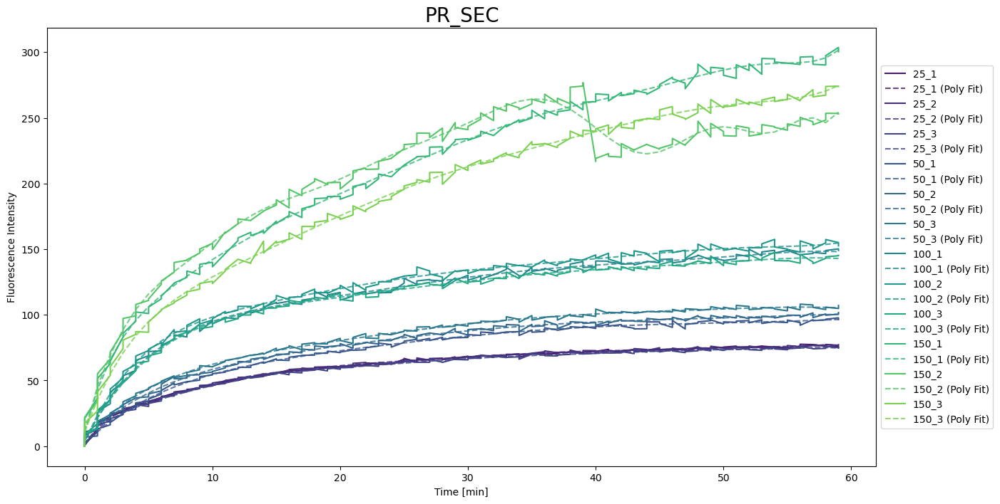

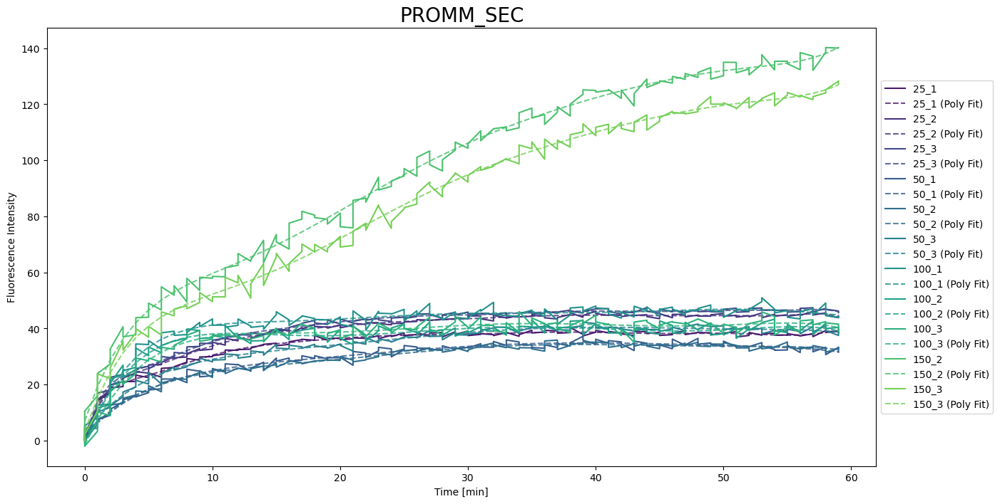

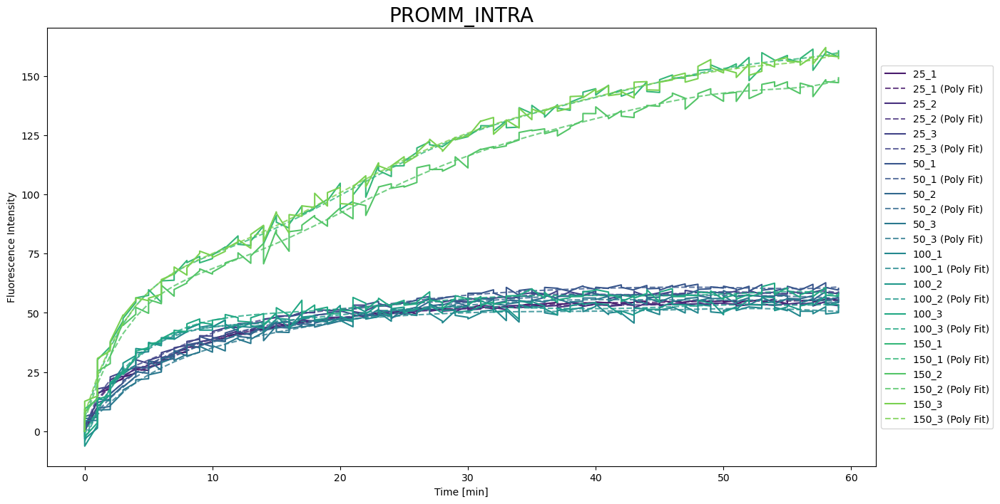

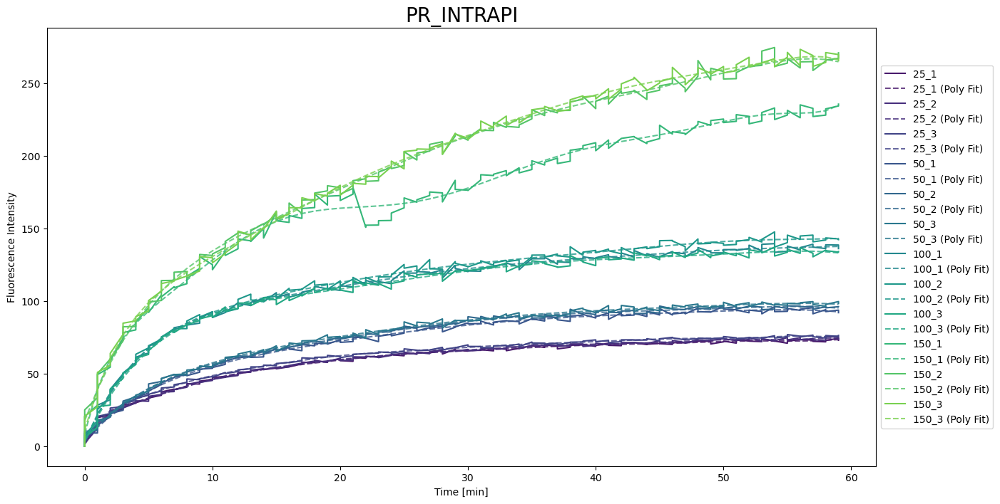

...

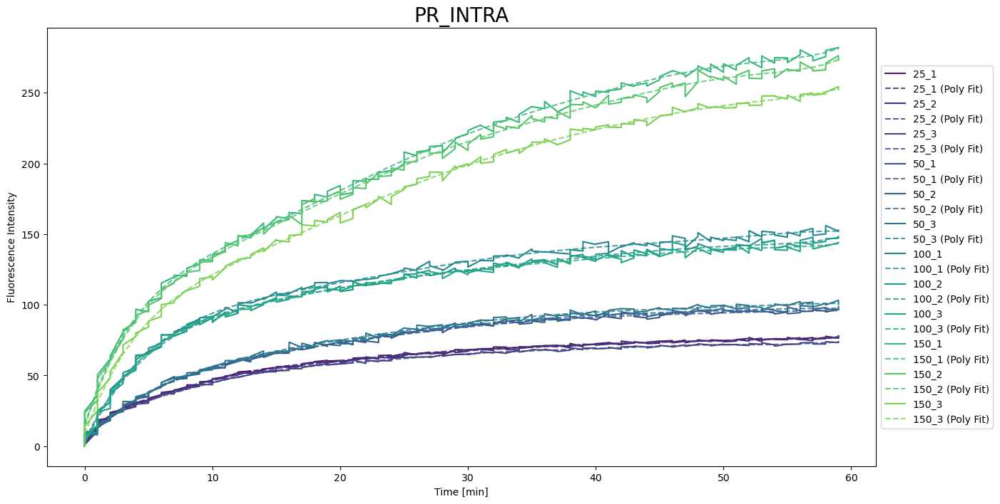

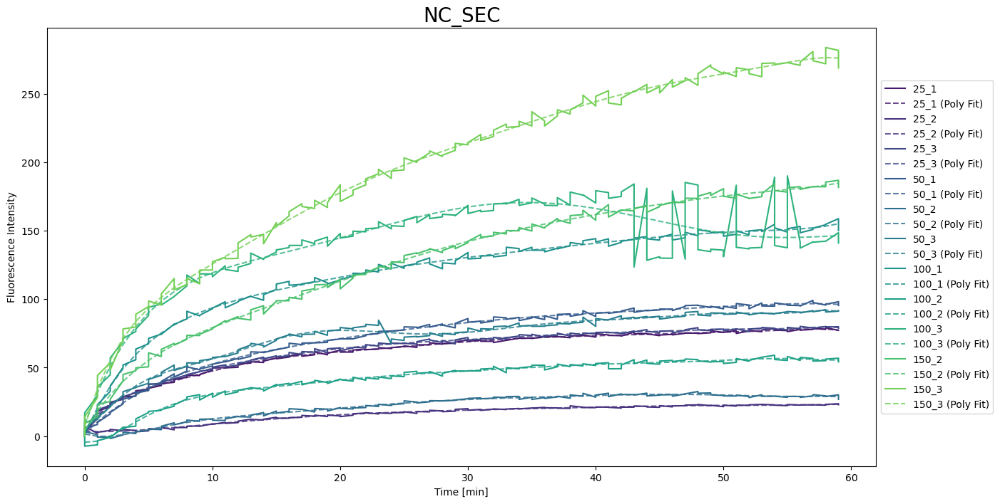

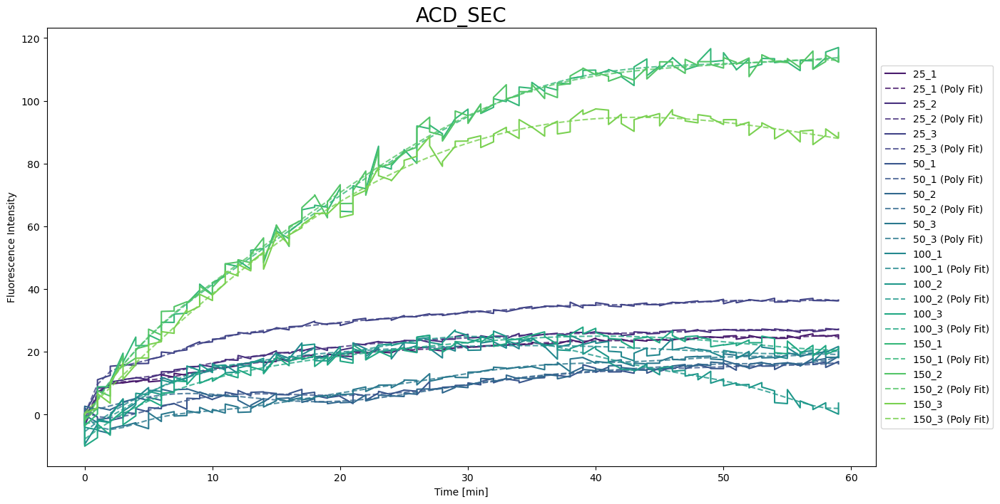

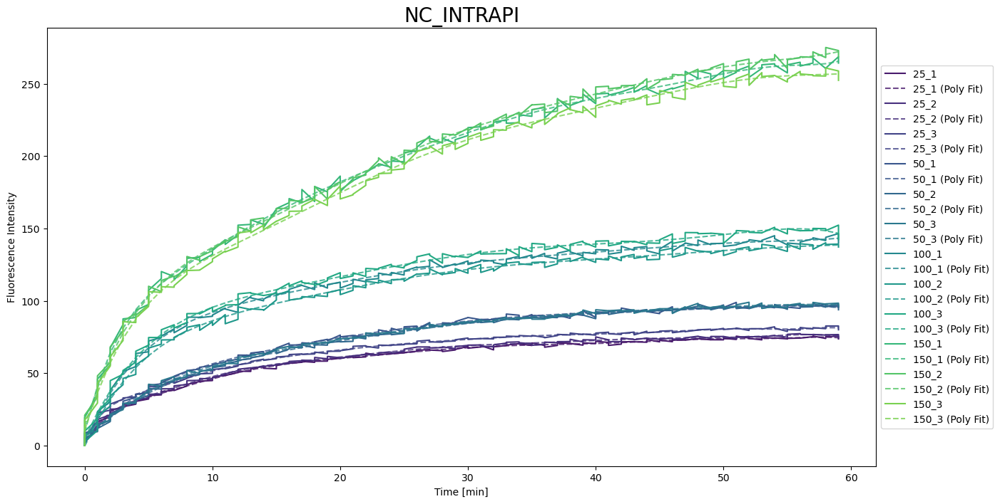

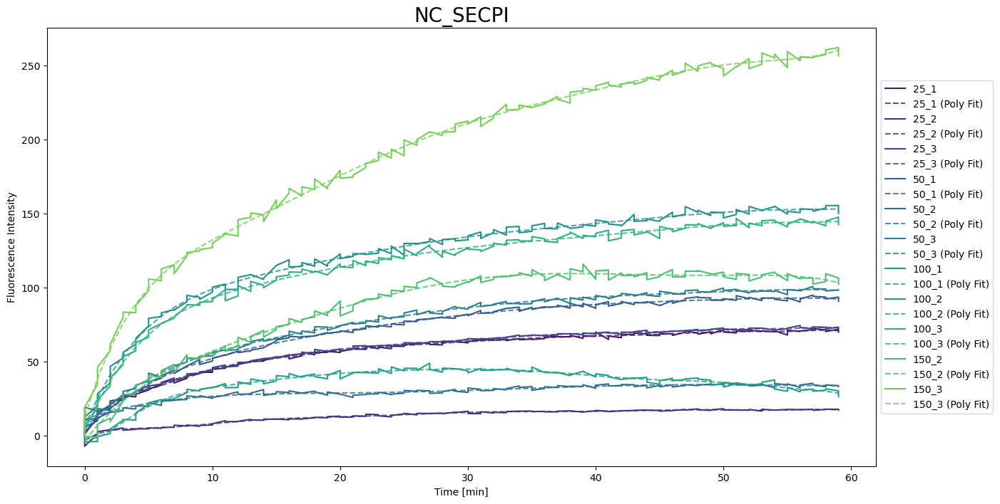

{'25_1': {'derivative_t0': np.float64(17.513871001372074),
  'degree': 12,
  'R²': np.float64(0.99617792537575)},
 '25_2': {'derivative_t0': np.float64(6.2402833362766055),
  'degree': 10,
  'R²': np.float64(0.981311013591653)},
 '25_3': {'derivative_t0': np.float64(17.10101327638996),
  'degree': 12,
  'R²': np.float64(0.9977223779407283)},
 '50_1': {'derivative_t0': np.float64(8.735760288169718),
  'degree': 6,
  'R²': np.float64(0.9968157892766061)},
 '50_2': {'derivative_t0': np.float64(3.104130989563386),
  'degree': 5,
  'R²': np.float64(0.905082184427032)},
 '50_3': {'derivative_t0': np.float64(9.08568024528629),
  'degree': 6,
  'R²': np.float64(0.9958921605169075)},
 '100_1': {'derivative_t0': np.float64(21.252034286087834),
  'degree': 7,
  'R²': np.float64(0.9937867604778162)},
 '100_2': {'derivative_t0': np.float64(-1.980420539455451),
  'degree': 11,
  'R²': np.float64(0.9791953060518794)},
 '100_3': {'derivative_t0': np.float64(20.46712901136053),
  'degree': 7,
  'R²': n

In [25]:
plot_kinetics(fluorescence_dic)

## Step 5: Box Plots of protease activity
Finally, we want to obtain box plots of our mean protease rates. In addition, it can be helpful to correct the rates by cell counts, to get insights into the protease activity per cell. Flow cytometry measurements are imported and the bulk proteolysis rates obtained from the previous steps divided by the cell counts. 

In [26]:
'''
The function cell_correction() is used to create a new array with fluorescence activities corrected by cell count. 
'''
def cell_cerrection(file):
    # Import FCM data
    FCM = pd.read_csv(file, delimiter='\t')
    # Group by 'Sample' and calculate the mean and std
    FCM_stat = FCM.groupby('Sample')['Events/ul'].agg(['mean', 'std']).reset_index()
    # Extract the mean of the seawater blank
    sw_blank_mean = FCM_stat.loc[FCM_stat['Sample'].str.contains('SW blank'), 'mean'].values[0]
    # Subtract the mean seawater blank from all samples
    FCM_stat['mean_bc'] = FCM_stat['mean'] - sw_blank_mean
    # Extract the base sample names (remove replicate numbers)
    FCM_stat['base_sample'] = FCM_stat['Sample'].str.replace(r'\s*\d+$', '', regex=True)
    # Group by the base sample name and calculate the mean and std across replicates
    FCM_summary = FCM_stat.groupby('base_sample').agg(
        mean_final=('mean_bc', 'mean'),  # Mean of blank-corrected values
        std_final=('mean_bc', 'std')     # Std of blank-corrected values
    ).reset_index()
    # Account for 50 ul sample volume in protease assay. Each FCM sample contained 2 ul of the original culture. Thus multiply by 25
    FCM_summary['Cells/PA'] = FCM_summary['mean_final'] * 25
    # Scale the standard deviation by the same factor
    FCM_summary['std_PA'] = FCM_summary['std_final'] * 25
    # Drop the last two rows based on index
    FCM_summary = FCM_summary.drop(FCM_summary.index[-2:])
    return FCM_summary

In [27]:
"""
The function summarize_derivatives() takes all files and summarizes the data in files created as output from plot_kinetics() and saves
them as pd dataframe as well as a combined summary file called derivatives_summary.csv. 

ARGUMENTS: 
    * input_folder: Input directory containing the polyfit_data*.csv files that were created as output from plot_kinetics()

OUTPUTS: 
    * derivatives_summary.csv: file containing derivatives for all conditions, their mean and standard deviation. 
"""
def summarize_derivatives(input_folder=''):
    summary_data = []

    # Go through all the polyfit output files
    for file in glob.glob(os.path.join(input_folder, "polyfit_data_*.csv")):
        key = os.path.basename(file).replace("polyfit_data_", "").replace(".csv", "")
        df = pd.read_csv(file)

        # Extract base condition (25, 50, etc.) by splitting before the "_"
        df['Condition'] = df['Condition'].str.extract(r'(\d+)_')
        df['Dataset'] = key
        
        # Mean/Std 
        condition_stats = df.groupby('Condition')['derivative_t0'].agg(['mean', 'std']).reset_index()
        condition_stats.columns = ['Condition', 'Mean', 'Std']
        df = df.merge(condition_stats, on='Condition', how='left')

        summary_data.append(df[['Condition', 'derivative_t0', 'Dataset', 'Mean', 'Std']])

    # Combine all summaries into a single DataFrame
    summary_df = pd.concat(summary_data, ignore_index=True)
    
    # Save summary
    summary_df.to_csv(os.path.join(input_folder, "derivatives_summary.csv"), index=False)
    print(f"Saved summary to: {os.path.join(input_folder, 'derivatives_summary.csv')}")
    return summary_df


summarize_derivatives('../output/kinetics')

Saved summary to: ../output/kinetics/derivatives_summary.csv


,Condition,derivative_t0,Dataset,Mean,Std
0,50,-0.153178,ACD_INTRAPI,-0.713157,0.888956
1,50,-1.738171,ACD_INTRAPI,-0.713157,0.888956
2,50,-0.248122,ACD_INTRAPI,-0.713157,0.888956
3,100,-0.595782,ACD_INTRAPI,-4.701668,3.680711
4,100,-7.705353,ACD_INTRAPI,-4.701668,3.680711
...,...,...,...,...,...
160,100,11.876705,PROMM_SEC,10.698306,1.059919
161,100,10.395396,PROMM_SEC,10.698306,1.059919
162,100,9.822819,PROMM_SEC,10.698306,1.059919
163,150,13.741480,PROMM_SEC,13.521401,0.311238


In [28]:
def plot_kinetics_boxplots(kinetics, y_col):
    conditions = ['25', '50', '100', '150']
    pi_statuses = ['noPI', 'PI']

    custom_order = [
        'PROMM_INTRA', 'PR_INTRA', 'NC_INTRA',
        'PROMM_SEC', 'PR_SEC', 'NC_SEC',
        'PROMM_INTRAPI', 'PR_INTRAPI', 'NC_INTRAPI',
        'PROMM_SECPI', 'PR_SECPI', 'NC_SECPI'
    ]

    fig, axes = plt.subplots(4, 2, figsize=(20, 40), sharey=True)
    axes = axes.flatten()

    plot_idx = 0
    for cond in conditions:
        for pi in pi_statuses:
            subset = kinetics[(kinetics['Condition'] == cond) & (kinetics['PI_status'] == pi)]
            ax = axes[plot_idx]
            if not subset.empty:
                present_datasets = subset['Dataset'].unique()
                ordered_datasets = [d for d in custom_order if d in present_datasets]

                sns.boxplot(x='Dataset', y=y_col, data=subset, ax=ax,
                            order=ordered_datasets,
                            showmeans=True, palette='viridis',
                            meanprops={"marker": "o", "markerfacecolor": "white", "markeredgecolor": "black"})
                sns.stripplot(x='Dataset', y=y_col, data=subset, ax=ax,
                              order=ordered_datasets,
                              color='black', size=5, jitter=True)
                ax.set_title(f'Cond {cond} - {pi}', fontsize=11)
                ax.set_xlabel('')
                ax.set_ylabel(y_col if plot_idx % 4 == 0 else '')
                ax.tick_params(axis='x', rotation=45)

                grouped = subset.groupby('Dataset')[y_col].apply(list)
                if len(grouped) > 1:
                    anova = f_oneway(*grouped)
                    print(f"ANOVA for {y_col}, Condition {cond} - {pi}: F = {anova.statistic:.2f}, p = {anova.pvalue:.2e}")
            else:
                ax.set_visible(False)

            plot_idx += 1

    plt.tight_layout()
    plt.savefig(f'../figures/kinetics/boxplot_{y_col}.pdf', format='pdf')
    plt.show()

ANOVA for v0_fmol, Condition 25 - noPI: F = 0.98, p = 4.70e-01
ANOVA for v0_fmol, Condition 25 - PI: F = 1.37, p = 3.19e-01


/var/folders/hb/hntvhz5j0j15vb_5h21tbhph0000gn/T/ipykernel_52181/1664997203.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Dataset', y=y_col, data=subset, ax=ax,
/var/folders/hb/hntvhz5j0j15vb_5h21tbhph0000gn/T/ipykernel_52181/1664997203.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Dataset', y=y_col, data=subset, ax=ax,
/var/folders/hb/hntvhz5j0j15vb_5h21tbhph0000gn/T/ipykernel_52181/1664997203.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Dataset', y=y_col, data=subset, ax=ax,


ANOVA for v0_fmol, Condition 50 - noPI: F = 2.98, p = 5.63e-02
ANOVA for v0_fmol, Condition 50 - PI: F = 6.92, p = 2.94e-03
ANOVA for v0_fmol, Condition 100 - noPI: F = 1.24, p = 3.51e-01
ANOVA for v0_fmol, Condition 100 - PI: F = 2.43, p = 9.61e-02
ANOVA for v0_fmol, Condition 150 - noPI: F = 5.71, p = 9.59e-03
ANOVA for v0_fmol, Condition 150 - PI: F = 1.16, p = 3.91e-01


/var/folders/hb/hntvhz5j0j15vb_5h21tbhph0000gn/T/ipykernel_52181/1664997203.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Dataset', y=y_col, data=subset, ax=ax,
/var/folders/hb/hntvhz5j0j15vb_5h21tbhph0000gn/T/ipykernel_52181/1664997203.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Dataset', y=y_col, data=subset, ax=ax,
/var/folders/hb/hntvhz5j0j15vb_5h21tbhph0000gn/T/ipykernel_52181/1664997203.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Dataset', y=y_col, data=subset, ax=ax,
/var/folders/hb/hntvhz5j0j15vb_5h2

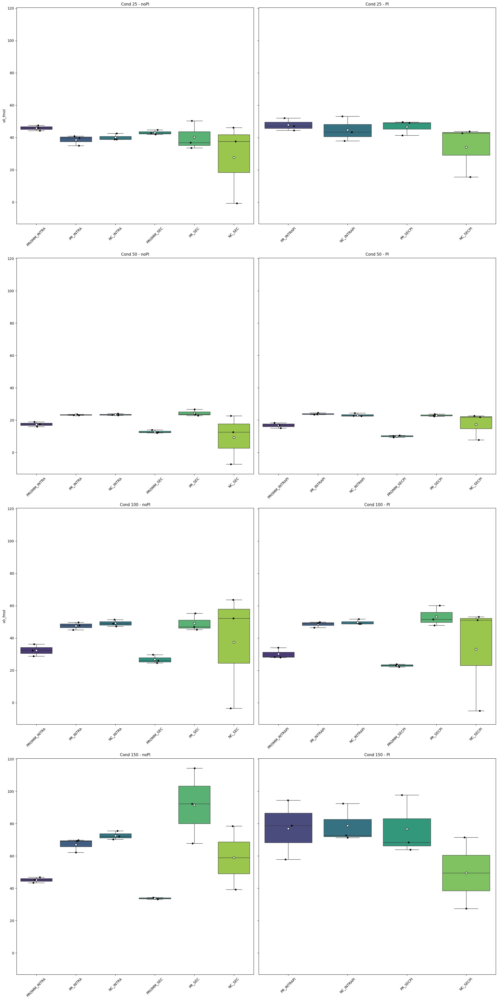

/var/folders/hb/hntvhz5j0j15vb_5h21tbhph0000gn/T/ipykernel_52181/1664997203.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Dataset', y=y_col, data=subset, ax=ax,
/var/folders/hb/hntvhz5j0j15vb_5h21tbhph0000gn/T/ipykernel_52181/1664997203.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Dataset', y=y_col, data=subset, ax=ax,
/var/folders/hb/hntvhz5j0j15vb_5h21tbhph0000gn/T/ipykernel_52181/1664997203.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Dataset', y=y_col, data=subset, ax=ax,
/var/folders/hb/hntvhz5j0j15vb_5h2

ANOVA for v0_cell, Condition 25 - noPI: F = 12.15, p = 2.35e-04
ANOVA for v0_cell, Condition 25 - PI: F = 0.72, p = 5.67e-01
ANOVA for v0_cell, Condition 50 - noPI: F = 3.09, p = 5.05e-02
ANOVA for v0_cell, Condition 50 - PI: F = 4.12, p = 2.07e-02
ANOVA for v0_cell, Condition 100 - noPI: F = 0.58, p = 7.16e-01
ANOVA for v0_cell, Condition 100 - PI: F = 0.71, p = 6.26e-01
ANOVA for v0_cell, Condition 150 - noPI: F = 1.69, p = 2.25e-01
ANOVA for v0_cell, Condition 150 - PI: F = 1.23, p = 3.69e-01


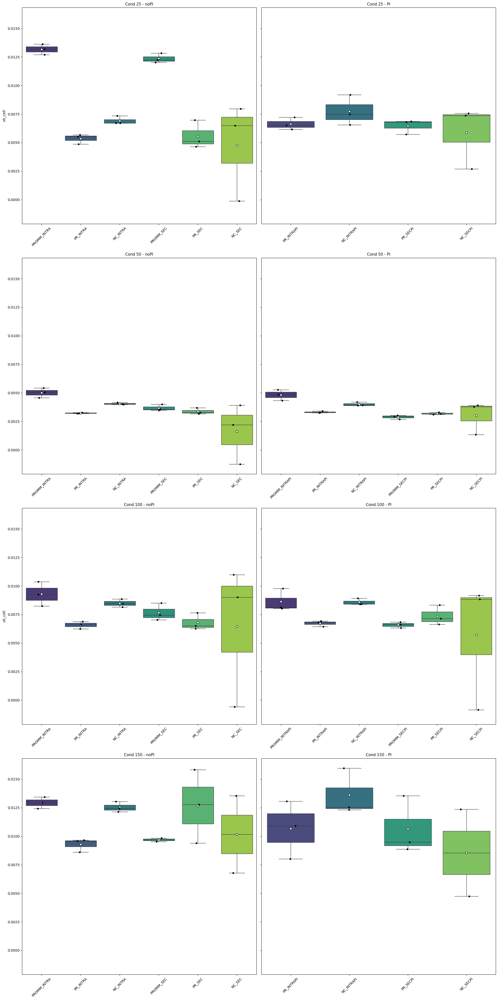

Saved summary to: ../figures/kinetics/v0_kinetics.csv


,Condition,derivative_t0,Dataset,Mean,Std,v0_fmol,base_sample,mean_final,std_final,Cells/PA,std_PA,v0_cell,PI_status
6,25,18.836535,PR_INTRAPI,19.151640,1.559848,47.091338,PR,288.777778,61.295580,7219.444444,1532.389504,0.006523,PI
7,25,17.773401,PR_INTRAPI,19.151640,1.559848,44.433502,PR,288.777778,61.295580,7219.444444,1532.389504,0.006155,PI
8,25,20.844985,PR_INTRAPI,19.151640,1.559848,52.112462,PR,288.777778,61.295580,7219.444444,1532.389504,0.007218,PI
9,50,9.395911,PR_INTRAPI,9.558222,0.221951,23.489777,PR,288.777778,61.295580,7219.444444,1532.389504,0.003254,PI
10,50,9.811144,PR_INTRAPI,9.558222,0.221951,24.527860,PR,288.777778,61.295580,7219.444444,1532.389504,0.003397,PI
...,...,...,...,...,...,...,...,...,...,...,...,...,...
160,100,11.876705,PROMM_SEC,10.698306,1.059919,29.691762,PROMM,139.555556,5.872093,3488.888889,146.802336,0.008510,noPI
161,100,10.395396,PROMM_SEC,10.698306,1.059919,25.988489,PROMM,139.555556,5.872093,3488.888889,146.802336,0.007449,noPI
162,100,9.822819,PROMM_SEC,10.698306,1.059919,24.557047,PROMM,139.555556,5.872093,3488.888889,146.802336,0.007039,noPI
163,150,13.741480,PROMM_SEC,13.521401,0.311238,34.353699,PROMM,139.555556,5.872093,3488.888889,146.802336,0.009847,noPI


In [29]:
def boxplot_kinetics(inputfile='', FCM_inputfile=''):
    # Read data
    kinetics_df = pd.read_csv(inputfile)
    FCM_summary = cell_cerrection(FCM_inputfile)

    # Convert to fmol
    kinetics_df['v0_fmol'] = kinetics_df['derivative_t0'] * 2.5

    # Extract sample from Dataset
    kinetics_df['base_sample'] = kinetics_df['Dataset'].str.extract(r'(^[A-Za-z]+)')

    # Merge cell counts
    kinetics = pd.merge(kinetics_df, FCM_summary, on='base_sample', how='left')
    kinetics = kinetics[~kinetics['Dataset'].str.contains('ACD', na=False)]

    # Normalize to cells
    kinetics['v0_cell'] = kinetics['v0_fmol'] / kinetics['Cells/PA']

    # Extract condition and PI label
    kinetics['PI_status'] = kinetics['Dataset'].apply(lambda x: 'PI' if 'PI' in x else 'noPI')
    kinetics['Condition'] = kinetics['Condition'].astype(str)

    # Plot both metrics
    plot_kinetics_boxplots(kinetics, 'v0_fmol')
    plot_kinetics_boxplots(kinetics, 'v0_cell')

    # Save kinetics dataframe to file
    kinetics.to_csv(os.path.join('../figures/kinetics/v0_kinetics.csv'), index=False)
    print(f"Saved summary to: {os.path.join('../figures/kinetics/v0_kinetics.csv')}")

    return kinetics

boxplot_kinetics('../output/kinetics/derivatives_summary.csv', '../data/growth_FCM/FCM_DSS3.txt')

## Step 6: Michaelis Menten Kinetics

/var/folders/hb/hntvhz5j0j15vb_5h21tbhph0000gn/T/ipykernel_52181/3969408233.py:31: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('viridis', len(datasets))


<Figure size 1500x800 with 0 Axes>

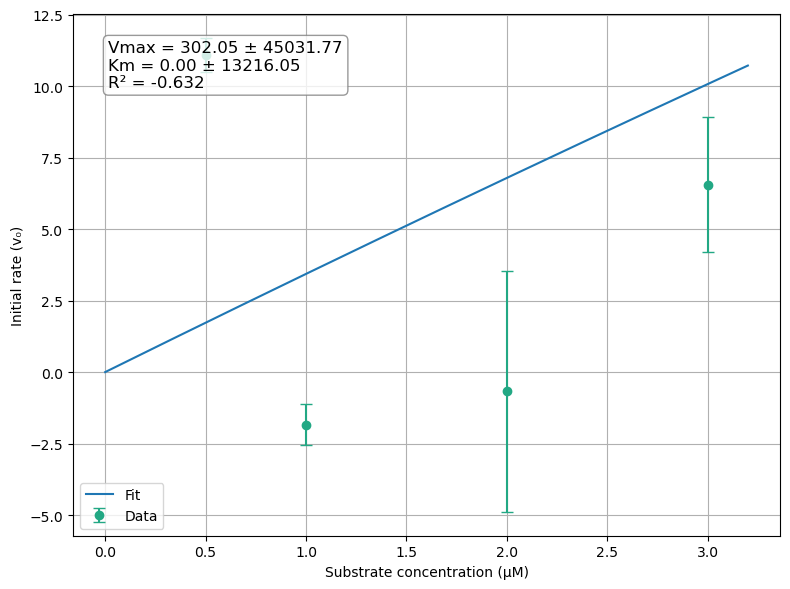

/var/folders/hb/hntvhz5j0j15vb_5h21tbhph0000gn/T/ipykernel_52181/3969408233.py:57: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(


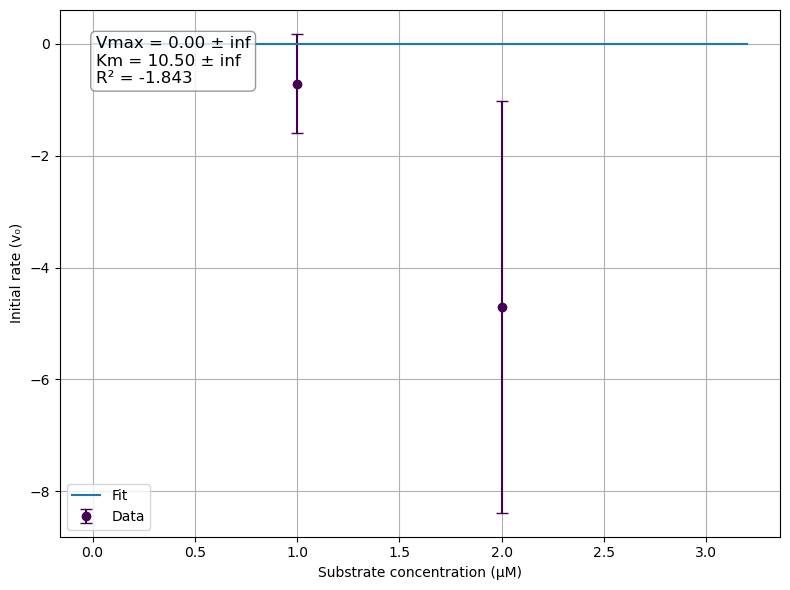

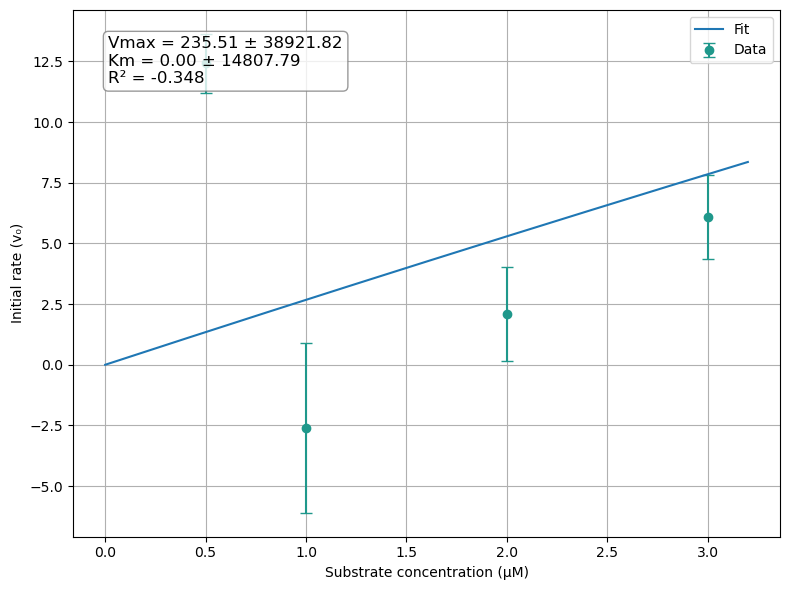

/var/folders/hb/hntvhz5j0j15vb_5h21tbhph0000gn/T/ipykernel_52181/3969408233.py:57: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(


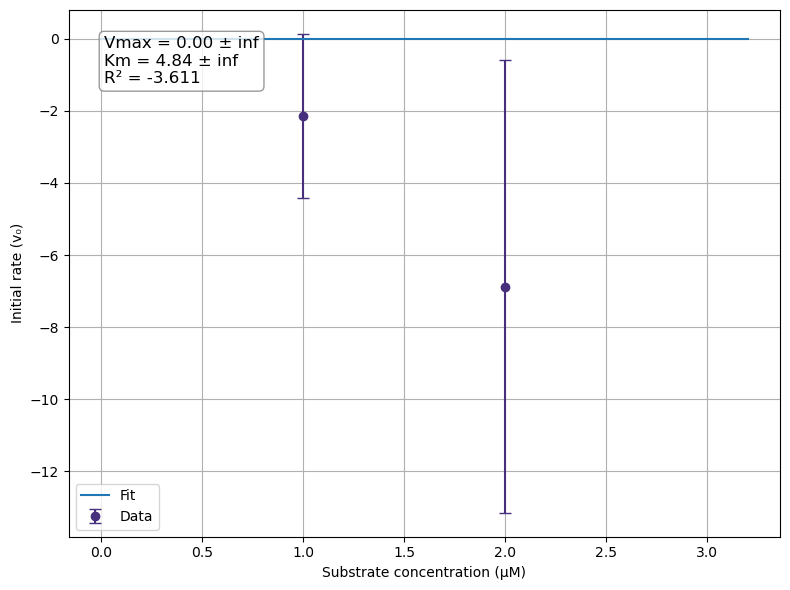

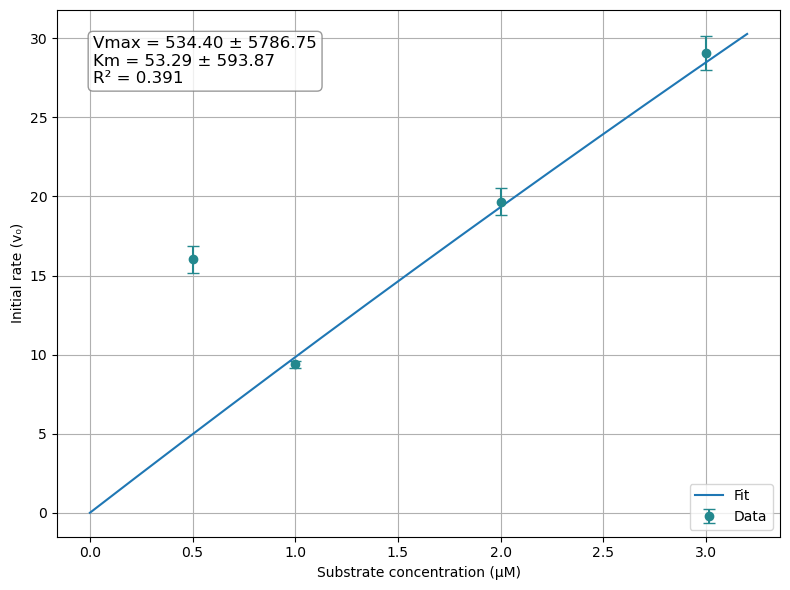

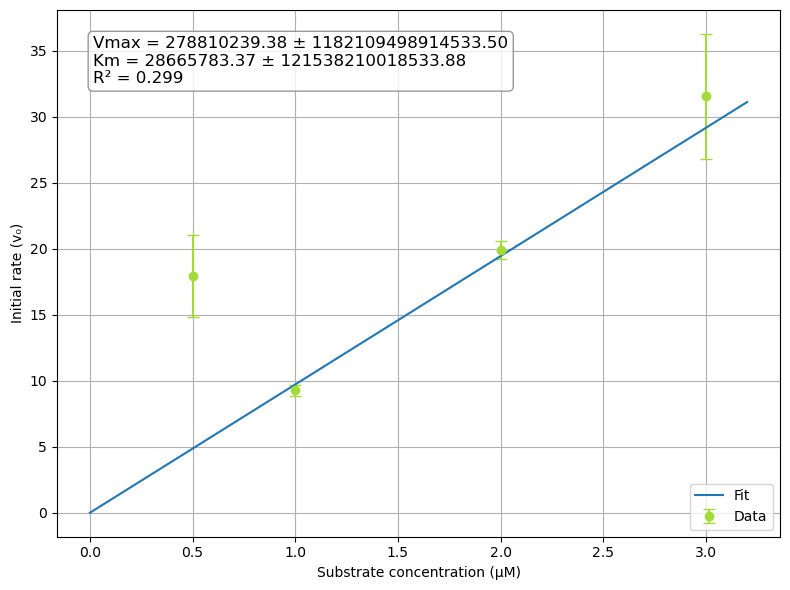

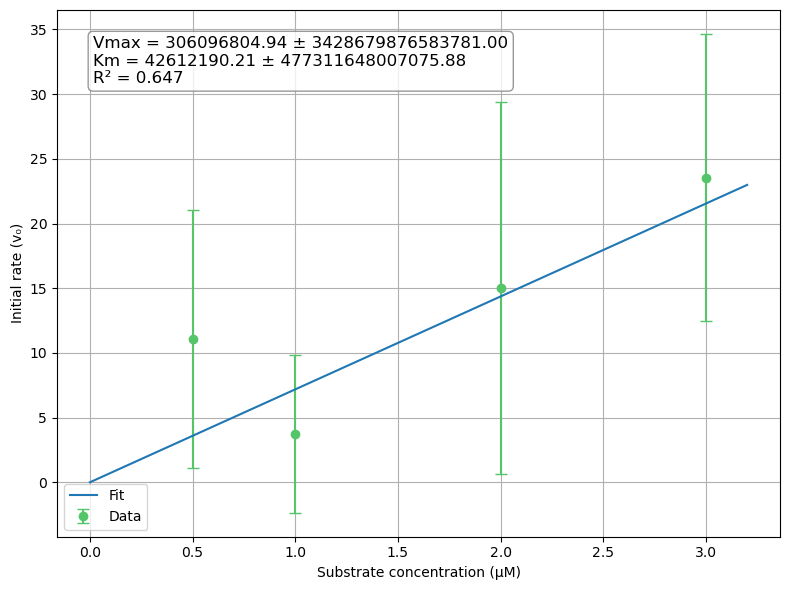

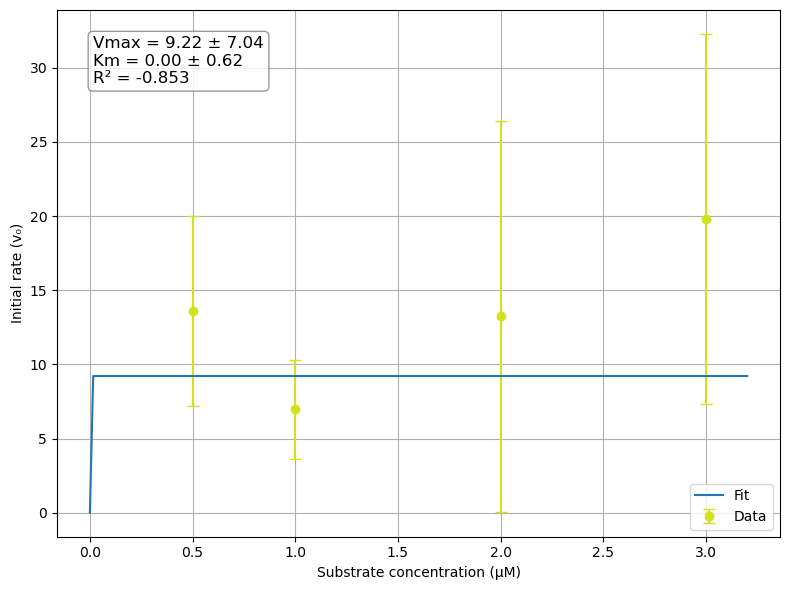

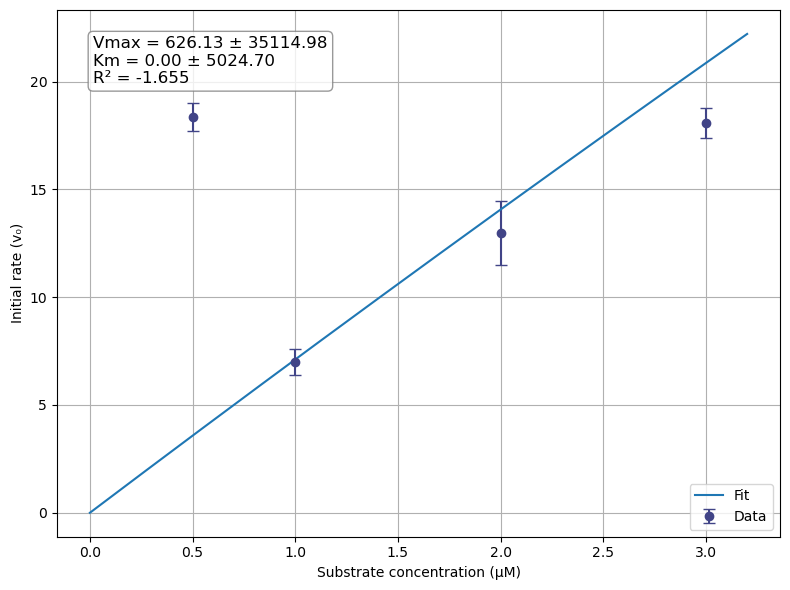

/var/folders/hb/hntvhz5j0j15vb_5h21tbhph0000gn/T/ipykernel_52181/3969408233.py:57: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(


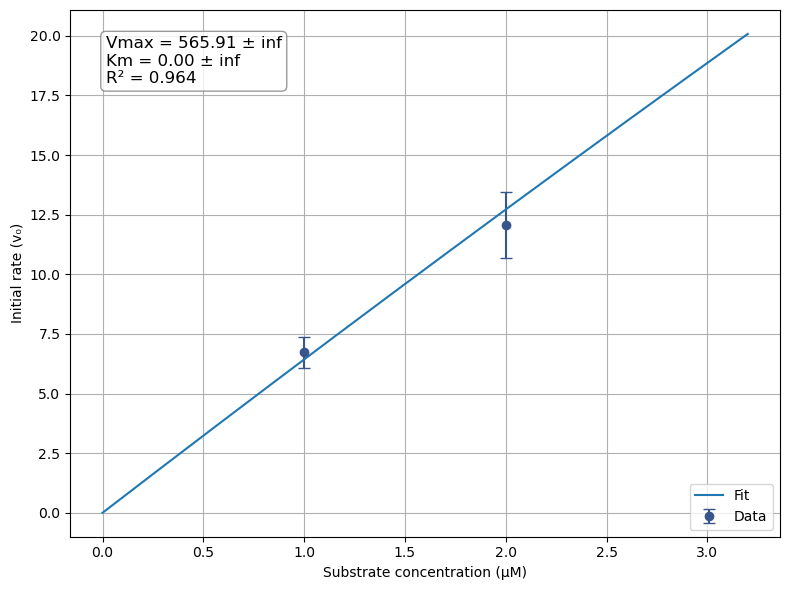

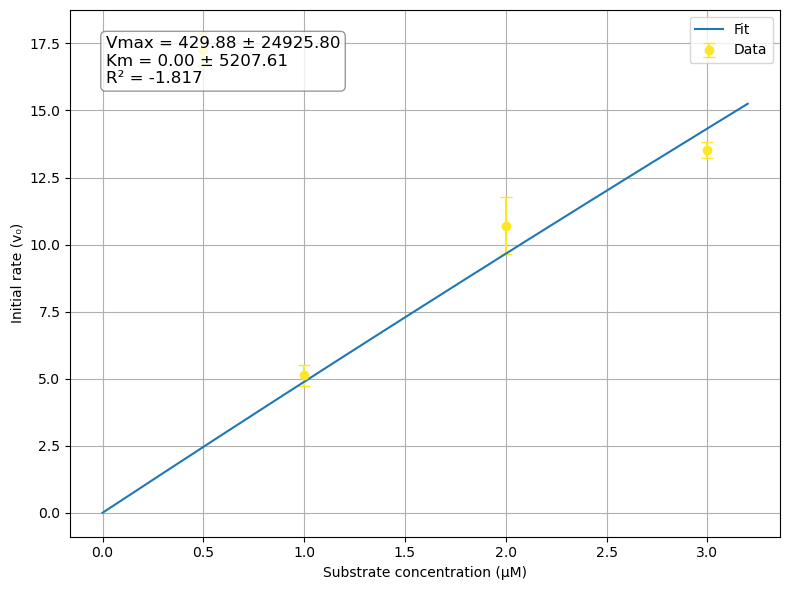

/var/folders/hb/hntvhz5j0j15vb_5h21tbhph0000gn/T/ipykernel_52181/3969408233.py:57: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(


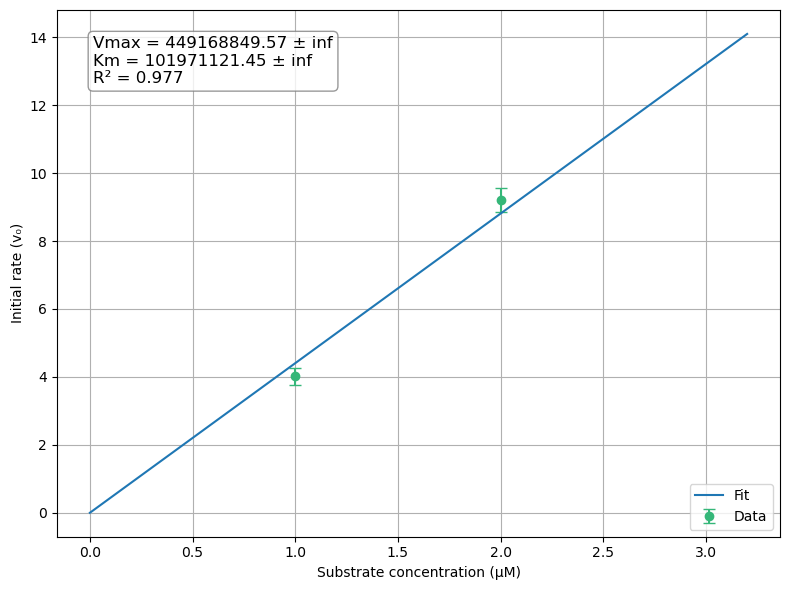

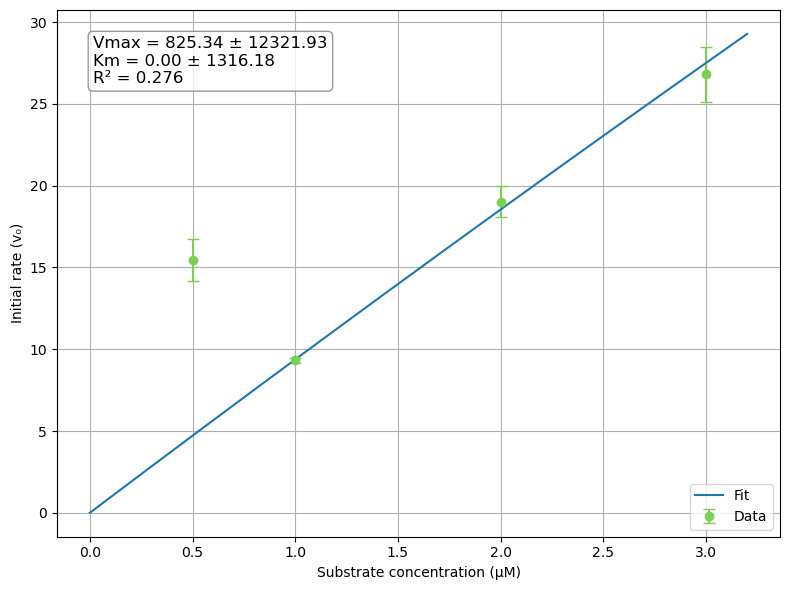

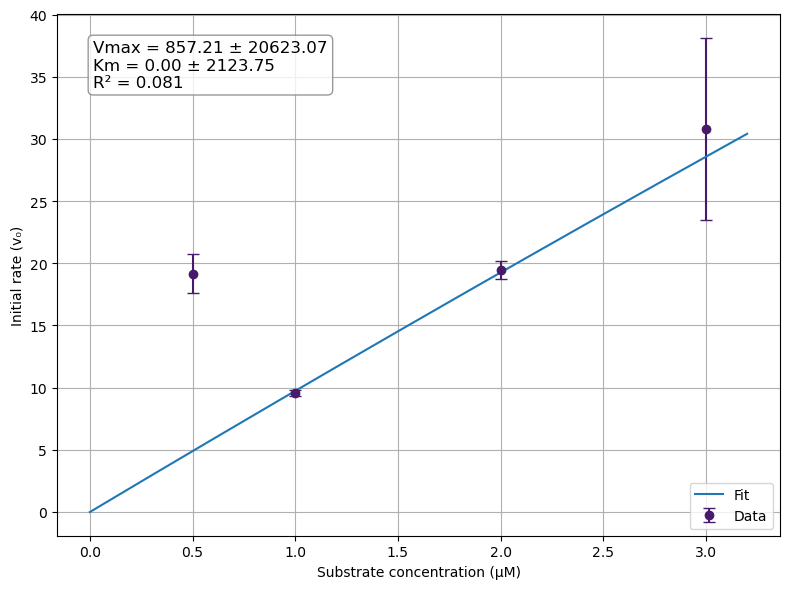

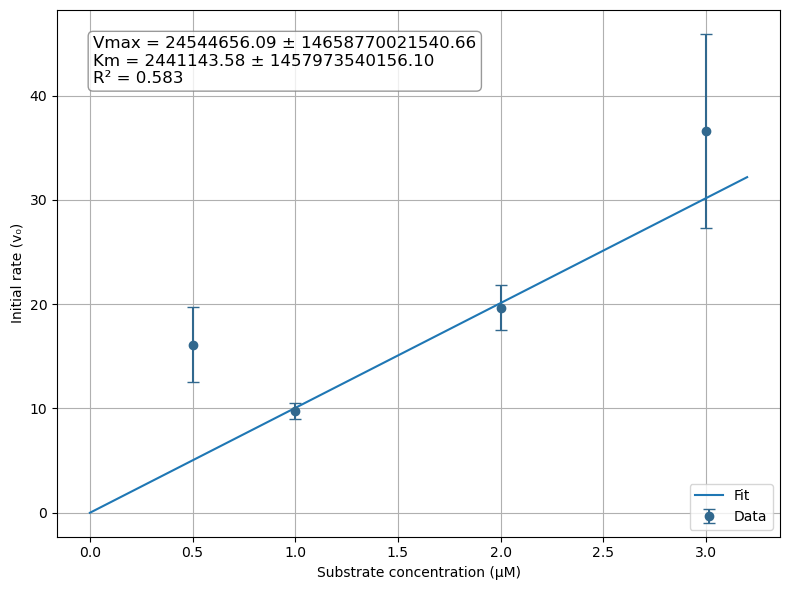

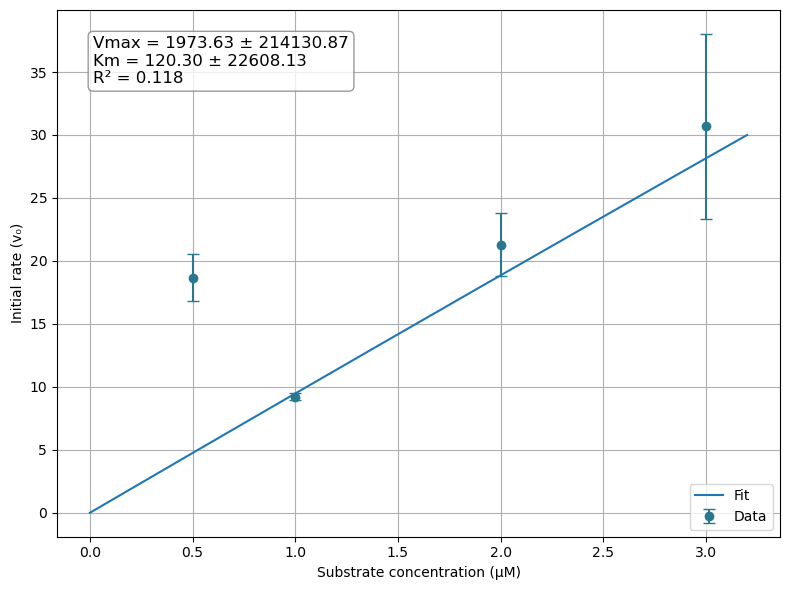

In [89]:
"""
Fits Michaelis-Menten equation to initial rates extracted from polynomial slopes in previous steps (derivatives_summary.csv).
Inputs: 
    - inputfile: should be derivatives_summary.csv from previous steps. 

Outputs:
    - Figure of the Michaelis Menten fit plot in pdf format
    - 'michaelis_menten.csv' output file
    
"""
def michaelis_menten_eq(s, Vmax, Km):
    return (Vmax * s) / (Km + s)

def michaelis_menten_competition(s, Vmax, Km, I=87): # I is the inhibitor concentration which is the concentration of FTC-Casein in µM
    return (Vmax * s) / (Km * (1+(I/Km)) + s)

def michaelis_menten(inputfile=''):
    cond_to_conc = {25: 0.5, 50: 1.0, 100: 2.0, 150: 3.0}
    
    ## Format dataframe
    kinetics_df = pd.read_csv(inputfile)
    kinetics_df = kinetics_df.drop_duplicates(subset=["Dataset", "Condition"])
    initial_rates = kinetics_df['Mean']
    initial_err = kinetics_df['Std']
    kinetics_df['Concentration'] = kinetics_df['Condition'].map(cond_to_conc) # Replace Condition values with substrate concentrations

    # Store fit results for CSV export
    fit_results = []

    datasets = list(kinetics_df["Dataset"].unique())
    cmap = cm.get_cmap('viridis', len(datasets))
    plt.figure(figsize=(15, 8))

    # Group by Dataset
    for dataset, group in kinetics_df.groupby("Dataset"):
        color = cmap(datasets.index(dataset))
        label = 'PR' if 'PR' and 'NC' in dataset else 'noPR'

        # Sort conditions and get corresponding substrate concentrations
        group = group.sort_values("Condition")
        x = group["Concentration"].values
        y = group["Mean"].values
        yerr = group["Std"].values
        
        # Fit the appropriate model
        if label == 'PR':
            popt, pcov = curve_fit(
                michaelis_menten_eq,
                x,
                y,
                sigma=yerr,
                absolute_sigma=False,
                bounds=(0, [np.inf, np.inf])
            )
            fit = michaelis_menten_eq
        else:
            popt, pcov = curve_fit(
                lambda s, Vmax, Km: michaelis_menten_competition(s, Vmax, Km, I=87),
                x,
                y,
                sigma=yerr,
                absolute_sigma=False,
                bounds=(0, [np.inf, np.inf])
            )
            fit = lambda s, Vmax, Km: michaelis_menten_competition(s, Vmax, Km, I=87)

        Vmax, Km = popt
        y_fit = fit(x, *popt)
        ss_res = np.sum((y - y_fit) ** 2)
        ss_tot = np.sum((y - np.mean(y)) ** 2)
        r_squared = 1 - (ss_res / ss_tot)
        perr = np.sqrt(np.diag(pcov))
        Vmax_err, Km_err = perr
        fit_results.append({
            "Dataset": dataset,
            "Competitive inhibition": label,
            "Vmax (µM/min)": f"{Vmax:.4f} ± {Vmax_err:.4f}",
            "Km (µM)": f"{Km:.4f} ± {Km_err:.4f}",
            "R2": r_squared
        })

        # Plotting
        fig, ax = plt.subplots(figsize=(8, 6))
        ax.errorbar(x, y, yerr=yerr, fmt='o', capsize=4, label="Data", color=color)
        x_fit = np.linspace(0, 3.2, 200)
        ax.plot(x_fit, fit(x_fit, *popt), label="Fit")
        ax.set_xlabel("Substrate concentration (µM)")
        ax.set_ylabel("Initial rate (v₀)")
        ax.grid(True)
        ax.legend()

        # Annotate with Vmax and Km
        ax.annotate(
            f"Vmax = {Vmax:.2f} ± {Vmax_err:.2f}\n"
            f"Km = {Km:.2f} ± {Km_err:.2f}\n"
            f"R² = {r_squared:.3f}",
            xy=(0.05, 0.95),  # Coordinates relative to axes (5% from left, 95% from bottom)
            xycoords='axes fraction',
            ha='left', va='top',
            fontsize=12,
            bbox=dict(boxstyle='round,pad=0.3', edgecolor='gray', facecolor='white', alpha=0.8)
        )

        # Save figure per dataset
        name = dataset.replace('/', '_').replace(' ', '_')
        plt.tight_layout()
        plt.savefig(f"../output/kinetics/michaelis_{name}.pdf", format='pdf')
        plt.show()

    # Save fit parameters to CSV
    pd.DataFrame(fit_results).to_csv("../output/kinetics/michaelis_menten.csv", index=False)

michaelis_menten('../output/kinetics/derivatives_summary.csv')